<a href="https://colab.research.google.com/github/aib1978/Dash-by-Plotly/blob/master/SEC_Filing_Scraper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

dict_keys(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71', '72', '73', '74', '75', '76', '77', '78', '79', '80', '81', '82', '83', '84', '85', '86', '87', '88', '89', '90', '91', '92', '93', '94', '95', '96', '97', '98', '99', '100', '101', '102', '103', '104', '105', '106', '107', '108', '109', '110', '111', '112', '113', '114', '115', '116', '117', '118', '119', '120', '121', '122', '123', '124', '125', '126', '127', '128', '129', '130', '131', '132', '133', '134', '135', '136', '137', '138', '139', '140', '141', '142', '143', '144', '145', '146', '147', '148', '149', '150', '151', '152', '153', '154', '155', '156', 

<Axes: xlabel='end'>

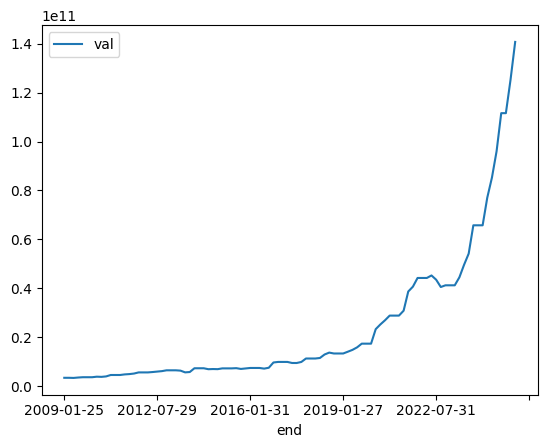

In [ ]:
# source: https://www.youtube.com/watch?v=Wr1NoM3JkTo

# -*- coding: utf-8 -*-
"""

SEC Filing Scraper
@author: AdamGetbags

"""

# import modules
import requests
import pandas as pd

# create request header
headers = {'User-Agent': "abrough78@hotmail.ca"}

# get all companies data
companyTickers = requests.get(
    "https://www.sec.gov/files/company_tickers.json",
    headers=headers
    )

# review response / keys
print(companyTickers.json().keys())

# format response to dictionary and get first key/value
firstEntry = companyTickers.json()['0']

# parse CIK // without leading zeros
directCik = companyTickers.json()['0']['cik_str']

# dictionary to dataframe
companyData = pd.DataFrame.from_dict(companyTickers.json(),
                                     orient='index')

# add leading zeros to CIK
companyData['cik_str'] = companyData['cik_str'].astype(
                           str).str.zfill(10)

# review data
print(companyData[:1])

cik = companyData.iloc[0].cik_str

# get company specific filing metadata
filingMetadata = requests.get(
    f'https://data.sec.gov/submissions/CIK{cik}.json',
    headers=headers
    )

# review json
print(filingMetadata.json().keys())
filingMetadata.json()['filings']
filingMetadata.json()['filings'].keys()
filingMetadata.json()['filings']['recent']
filingMetadata.json()['filings']['recent'].keys()

# dictionary to dataframe
allForms = pd.DataFrame.from_dict(
             filingMetadata.json()['filings']['recent']
             )

# review columns
allForms.columns
allForms[['accessionNumber', 'reportDate', 'form']].head(50)

# 10-Q metadata
allForms.iloc[11]

# get company facts data
companyFacts = requests.get(
    f'https://data.sec.gov/api/xbrl/companyfacts/CIK{cik}.json',
    headers=headers
    )

#review data
companyFacts.json().keys()
companyFacts.json()['facts']
companyFacts.json()['facts'].keys()

# filing metadata
# Check if the key exists before accessing it
if 'EntityCommonStockSharesOutstanding' in companyFacts.json()['facts']['dei']:
    print(companyFacts.json()['facts']['dei'][
        'EntityCommonStockSharesOutstanding'])
    print(companyFacts.json()['facts']['dei'][
        'EntityCommonStockSharesOutstanding'].keys())
    print(companyFacts.json()['facts']['dei'][
        'EntityCommonStockSharesOutstanding']['units'])
    print(companyFacts.json()['facts']['dei'][
        'EntityCommonStockSharesOutstanding']['units']['shares'])
    print(companyFacts.json()['facts']['dei'][
        'EntityCommonStockSharesOutstanding']['units']['shares'][0])
else:
    print("'EntityCommonStockSharesOutstanding' data not available for this company.")


# concept data // financial statement line items
companyFacts.json()['facts']['us-gaap']
companyFacts.json()['facts']['us-gaap'].keys()

# different amounts of data available per concept
# Check if the key exists before accessing it
if 'AccountsPayable' in companyFacts.json()['facts']['us-gaap']:
    print(companyFacts.json()['facts']['us-gaap']['AccountsPayable'])
else:
    print("'AccountsPayable' data not available for this company.")

if 'Revenues' in companyFacts.json()['facts']['us-gaap']:
    print(companyFacts.json()['facts']['us-gaap']['Revenues'])
else:
    print("'Revenues' data not available for this company.")

if 'Assets' in companyFacts.json()['facts']['us-gaap']:
    print(companyFacts.json()['facts']['us-gaap']['Assets'])
else:
    print("'Assets' data not available for this company.")


# get company concept data
companyConcept = requests.get(
    (
    f'https://data.sec.gov/api/xbrl/companyconcept/CIK{cik}'
     f'/us-gaap/Assets.json'
    ),
    headers=headers
    )

# review data
companyConcept.json().keys()
companyConcept.json()['units']
companyConcept.json()['units'].keys()
companyConcept.json()['units']['USD']
companyConcept.json()['units']['USD'][0]

# parse assets from single filing
companyConcept.json()['units']['USD'][0]['val']

# get all filings data
assetsData = pd.DataFrame.from_dict((
               companyConcept.json()['units']['USD']))

# review data
assetsData.columns
assetsData.form

# get assets from 10Q forms and reset index
assets10Q = assetsData[assetsData.form == '10-Q']
assets10Q = assets10Q.reset_index(drop=True)

# plot
assets10Q.plot(x='end', y='val')

In [ ]:
# @title AI prompt cell

import ipywidgets as widgets
from IPython.display import display, HTML, Markdown,clear_output
from google.colab import ai

dropdown = widgets.Dropdown(
    options=[],
    layout={'width': 'auto'}
)

def update_model_list(new_options):
    dropdown.options = new_options
update_model_list(ai.list_models())

text_input = widgets.Textarea(
    placeholder='Ask me anything....',
    layout={'width': 'auto', 'height': '100px'},
)

button = widgets.Button(
    description='Submit Text',
    disabled=False,
    tooltip='Click to submit the text',
    icon='check'
)

output_area = widgets.Output(
     layout={'width': 'auto', 'max_height': '300px','overflow_y': 'scroll'}
)

def on_button_clicked(b):
    with output_area:
        output_area.clear_output(wait=False)
        accumulated_content = ""
        for new_chunk in ai.generate_text(prompt=text_input.value, model_name=dropdown.value, stream=True):
            if new_chunk is None:
                continue
            accumulated_content += new_chunk
            clear_output(wait=True)
            display(Markdown(accumulated_content))

button.on_click(on_button_clicked)
vbox = widgets.GridBox([dropdown, text_input, button, output_area])

display(HTML("""
<style>
.widget-dropdown select {
    font-size: 18px;
    font-family: "Arial", sans-serif;
}
.widget-textarea textarea {
    font-size: 18px;
    font-family: "Arial", sans-serif;
}
</style>
"""))
display(vbox)


GridBox(children=(Dropdown(layout=Layout(width='auto'), options=('google/gemini-2.5-flash', 'google/gemini-2.5…

In [ ]:
firstEntry = companyTickers.json()['0']

In [ ]:
firstEntry

{'cik_str': 1045810, 'ticker': 'NVDA', 'title': 'NVIDIA CORP'}

In [ ]:
directCik = companyTickers.json()['0']['cik_str']

In [ ]:
directCik

1045810

In [ ]:
companyData = pd.DataFrame.from_dict(companyTickers.json(),
                                     orient='index')

In [ ]:
companyData

,cik_str,ticker,title
0,1045810,NVDA,NVIDIA CORP
1,789019,MSFT,MICROSOFT CORP
2,320193,AAPL,Apple Inc.
3,1652044,GOOGL,Alphabet Inc.
4,1018724,AMZN,AMAZON COM INC
...,...,...,...
10137,1840425,OSRHW,"OSR Holdings, Inc."
10138,1693577,MNSBP,"MainStreet Bancshares, Inc."
10139,2028355,MAYAR,Maywood Acquisition Corp.
10140,2028355,MAYAU,Maywood Acquisition Corp.


In [ ]:
companyData['cik_str'] = companyData['cik_str'].astype(
                           str).str.zfill(10)

In [ ]:
print(companyData[:1])

cik = companyData.iloc[0].cik_str

      cik_str ticker        title
0  0001045810   NVDA  NVIDIA CORP


In [ ]:
cik

'0001045810'

In [ ]:
filingMetadata = requests.get(
    f'https://data.sec.gov/submissions/CIK{cik}.json',
    headers=headers
    )

In [ ]:
print(filingMetadata.json().keys())

dict_keys(['cik', 'entityType', 'sic', 'sicDescription', 'ownerOrg', 'insiderTransactionForOwnerExists', 'insiderTransactionForIssuerExists', 'name', 'tickers', 'exchanges', 'ein', 'lei', 'description', 'website', 'investorWebsite', 'category', 'fiscalYearEnd', 'stateOfIncorporation', 'stateOfIncorporationDescription', 'addresses', 'phone', 'flags', 'formerNames', 'filings'])


In [ ]:
filingMetadata.json()['filings']

{'recent': {'accessionNumber': ['0001197649-25-000056',
   '0001921094-25-001301',
   '0001197649-25-000054',
   '0001921094-25-001296',
   '0001921094-25-001292',
   '0001921094-25-001288',
   '0001588670-25-000011',
   '0001197649-25-000052',
   '0001921094-25-001285',
   '0001921094-25-001284',
   '0001921094-25-001281',
   '0001197649-25-000050',
   '0001921094-25-001276',
   '0001921094-25-001272',
   '0001921094-25-001268',
   '0001197649-25-000048',
   '0001921094-25-001262',
   '0001921094-25-001256',
   '0001921094-25-001254',
   '0001197649-25-000046',
   '0001921094-25-001252',
   '0001921094-25-001250',
   '0001921094-25-001247',
   '0001197649-25-000044',
   '0001921094-25-001245',
   '0001921094-25-001241',
   '0001921094-25-001232',
   '0001197649-25-000042',
   '0001921094-25-001230',
   '0001921094-25-001222',
   '0001921094-25-001218',
   '0001197649-25-000040',
   '0001921094-25-001212',
   '0001921094-25-001207',
   '0001921094-25-001205',
   '0001197649-25-000038',

In [ ]:
filingMetadata.json()['filings'].keys()

dict_keys(['recent', 'files'])

In [ ]:
filingMetadata.json()['filings']['recent']

{'accessionNumber': ['0001197649-25-000056',
  '0001921094-25-001301',
  '0001197649-25-000054',
  '0001921094-25-001296',
  '0001921094-25-001292',
  '0001921094-25-001288',
  '0001588670-25-000011',
  '0001197649-25-000052',
  '0001921094-25-001285',
  '0001921094-25-001284',
  '0001921094-25-001281',
  '0001197649-25-000050',
  '0001921094-25-001276',
  '0001921094-25-001272',
  '0001921094-25-001268',
  '0001197649-25-000048',
  '0001921094-25-001262',
  '0001921094-25-001256',
  '0001921094-25-001254',
  '0001197649-25-000046',
  '0001921094-25-001252',
  '0001921094-25-001250',
  '0001921094-25-001247',
  '0001197649-25-000044',
  '0001921094-25-001245',
  '0001921094-25-001241',
  '0001921094-25-001232',
  '0001197649-25-000042',
  '0001921094-25-001230',
  '0001921094-25-001222',
  '0001921094-25-001218',
  '0001197649-25-000040',
  '0001921094-25-001212',
  '0001921094-25-001207',
  '0001921094-25-001205',
  '0001197649-25-000038',
  '0001921094-25-001203',
  '0001636665-25-00

In [ ]:
filingMetadata.json()['filings']['recent'].keys()

dict_keys(['accessionNumber', 'filingDate', 'reportDate', 'acceptanceDateTime', 'act', 'form', 'fileNumber', 'filmNumber', 'items', 'core_type', 'size', 'isXBRL', 'isInlineXBRL', 'primaryDocument', 'primaryDocDescription'])

In [ ]:
allForms = pd.DataFrame.from_dict(
             filingMetadata.json()['filings']['recent']
             )

In [ ]:
allForms.columns

Index(['accessionNumber', 'filingDate', 'reportDate', 'acceptanceDateTime',
       'act', 'form', 'fileNumber', 'filmNumber', 'items', 'core_type', 'size',
       'isXBRL', 'isInlineXBRL', 'primaryDocument', 'primaryDocDescription'],
      dtype='object')

In [ ]:
allForms[['accessionNumber', 'reportDate', 'form']].head(50)

,accessionNumber,reportDate,form
0,0001197649-25-000056,2025-10-29,4
1,0001921094-25-001301,,144
2,0001197649-25-000054,2025-10-24,4
3,0001921094-25-001296,,144
4,0001921094-25-001292,,144
5,0001921094-25-001288,,144
6,0001588670-25-000011,2025-10-21,4
7,0001197649-25-000052,2025-10-21,4
8,0001921094-25-001285,,144
9,0001921094-25-001284,,144


In [ ]:
allForms.iloc[11]

,11
accessionNumber,0001197649-25-000050
filingDate,2025-10-20
reportDate,2025-10-16
acceptanceDateTime,2025-10-21T01:36:13.000Z
act,
form,4
fileNumber,
filmNumber,
items,
core_type,4


In [ ]:
companyFacts = requests.get(
    f'https://data.sec.gov/api/xbrl/companyfacts/CIK{cik}.json',
    headers=headers
    )


In [ ]:
companyFacts.json().keys()

dict_keys(['cik', 'entityName', 'facts'])

In [ ]:
companyFacts.json()['facts']

{'dei': {'EntityCommonStockSharesOutstanding': {'label': 'Entity Common Stock, Shares Outstanding',
   'description': "Indicate number of shares or other units outstanding of each of registrant's classes of capital or common stock or other ownership interests, if and as stated on cover of related periodic report. Where multiple classes or units exist define each class/interest by adding class of stock items such as Common Class A [Member], Common Class B [Member] or Partnership Interest [Member] onto the Instrument [Domain] of the Entity Listings, Instrument.",
   'units': {'shares': [{'end': '2009-08-17',
      'val': 547800000,
      'accn': '0001045810-09-000024',
      'fy': 2009,
      'fp': 'Q2',
      'form': '10-Q',
      'filed': '2009-08-20',
      'frame': 'CY2009Q3I'},
     {'end': '2009-11-17',
      'val': 554900000,
      'accn': '0001045810-09-000036',
      'fy': 2009,
      'fp': 'Q3',
      'form': '10-Q',
      'filed': '2009-11-19',
      'frame': 'CY2009Q4I'},
   

In [ ]:
companyFacts.json()['facts'].keys()